In [1]:
import numpy as np

### Reading data

In [2]:
import pandas as pd
df = pd.read_csv("Real estate valuation data set.csv") # Import data
#df = df.ix[:,'SalesID':'ProductGroupDesc'] # Remove extraneous features
#df # Show our data
df.head()

,No,X1 transaction date,X2 house age,X3 distance to the nearest MRT station,X4 number of convenience stores,X5 latitude,X6 longitude,Y house price of unit area
0,1,2012.917,32.0,84.87882,10,24.98298,121.54024,37.9
1,2,2012.917,19.5,306.59470,9,24.98034,121.53951,42.2
2,3,2013.583,13.3,561.98450,5,24.98746,121.54391,47.3
3,4,2013.500,13.3,561.98450,5,24.98746,121.54391,54.8
4,5,2012.833,5.0,390.56840,5,24.97937,121.54245,43.1


### Splitting dataset

In [3]:
input_feat_df=df.iloc[:,1:7]
output_feat_df=df.iloc[:,7]
training_input_feat_df=input_feat_df.iloc[0:300,:]
#print(training_input_feat_df)  v
testing_input_feat_df=input_feat_df.iloc[301:414,:]
#print(testing_input_feat_df)    v
training_output_feat_df=output_feat_df.iloc[0:300]
#print(training_output_feat_df)
testing_output_feat_df=output_feat_df.iloc[301:414]
#print(testing_output_feat_df)

In [4]:
TR,TC=input_feat_df.shape
print(TC)
print(TR)
print(input_feat_df.shape)
x=np.ones([TR,TC+1])
print(x.shape)
x[:,1:TC+1]=input_feat_df.values
y=output_feat_df
the=np.ones([TC+1,1])
print(the.shape)
lamda=1;
I_dash=np.identity(TC+1)
I_dash[0,0]=0
#print(I_dash)
#A=np.dot((x.transpose()),x)
print(y.shape)
A1=np.linalg.inv(((x.transpose())@x)+lamda*I_dash)
B1=np.dot((x.transpose()),y)
print(A1.shape)
Z1=A1@B1
print(Z1)


#print(x)

6
414
(414, 6)
(414, 7)
(7, 1)
(414,)
(7, 7)
[-1.12500421e+04  5.58301903e+00 -2.55035842e-01 -5.47889802e-03
  1.25338547e+00  8.76020308e+00 -1.35630462e+00]


### 2(a) NormalEquationRidgeRegression

In [5]:
def normalEquationRidgeRegression(X_df,Y_df,lamda):
    r,c=X_df.shape
    X1_np=np.ones([r,c+1])
    X1_np[:,1:c+1]=X_df.values
    theta=np.ones([c+1,1])
    I_Dash=np.identity(c+1)
    I_Dash[0,0]=0
    A=np.linalg.inv(((X1_np.transpose())@X1_np)+lamda*I_Dash)
    B=(X1_np.transpose())@Y_df.values
    theta=A@B
    return theta   

In [6]:
z=normalEquationRidgeRegression(training_input_feat_df,training_output_feat_df,1)
print("The output parameters from Ridge regression is\n",z)

The output parameters from Ridge regression is
 [-1.08574347e+04  5.38315654e+00 -2.88572819e-01 -5.39987399e-03
  1.23098333e+00  7.36408243e+00 -9.83912315e-01]


### 2(b) Cordinate Gradient Descent Regression

In [7]:
ri,ci=training_input_feat_df.shape
X1_np=np.ones([ri,ci+1])
Y1_np=np.ones([ri,1])
Y1_np[:,0]=training_output_feat_df.values
#print(Y1_np.shape)
X1_np[:,1:ci+1]=training_input_feat_df.values
theta_cd=np.zeros([ci+1,1])
#print(theta_cd[i])
for i in range(1,10):
    for temp in range(len(theta_cd)):
        #print(temp)
        err=(X1_np[:,temp]@((X1_np@theta_cd) - (Y1_np)))
        #err2=err@err.transpose()
        #print(err)
        theta_cd[temp,0]=theta_cd[temp,0]-((0.000001/ri)*(err))
print("THETA is\n",theta_cd.T)   
 #(X1_np[:,temp])   

THETA is
 [[ 2.64133603e-02  5.31737078e+01 -1.45141232e+00 -1.17008980e+02
  -3.50999763e-02  1.16725094e+00  5.68085659e+00]]


### 2(b) CDG

In [8]:
def CDG(training_input_feat_df,training_output_feat_df):
    ri,ci=training_input_feat_df.shape
    X1_np=np.ones([ri,ci+1])
    Y1_np=np.ones([ri,1])
    Y1_np[:,0]=training_output_feat_df
    print(Y1_np.shape)
    X1_np[:,1:ci+1]=training_input_feat_df
    theta_cd=np.zeros([ci+1,1])
    theta0=[]
    theta1=[]
    J_hist=[]
    #print(theta_cd[i])
    for i in range(1,20):
        for temp in range(len(theta_cd)):
            #print(temp)
            err=np.sum(X1_np[:,temp]@((X1_np@theta_cd) - (Y1_np)))
            J=(np.sum(((X1_np@theta_cd) - (Y1_np))**2))/2*ri
            J_hist.append(J)
            #J=np.dot(((X1_np@theta_cd) - (Y1_np)),((X1_np@theta_cd) - (Y1_np)).transpose())
            #print("J is",J)
            #err2=err@err.transpose()
            #print(err.shape)
            theta_cd[temp,0]=theta_cd[temp,0]-((0.01/ri)*(err))
            theta0.append(theta_cd[0,0])
            theta1.append(theta_cd[1,0])
    #print("theta0 is\n",theta0)
    #print("theta1 is\n",theta1)
    #print("J is", J_hist)
    return theta_cd,theta0,theta1,J_hist
 #(X1_np[:,temp])   

### 3(b) Cordinate Descent Gradient Animation

In [9]:
from matplotlib import pyplot as plt
x=np.array([[1],[3],[6]])
y=np.array([6,10,16])
y1=np.array([[6],[10],[16]])
theta_cd,theta0,theta1,J_hist=CDG(x,y)
#print(y.shape)
#z1=np.zeros([3,1])
z3=[]
a0, a1 = np.meshgrid(theta0,theta1)
#T0, T1 = np.meshgrid(np.linspace(0,5,0.1),np.linspace(0,5,0.1))
#print(T0.shape)
z2=np.array([a0.shape])

for t0, t1 in zip(np.ravel(a0), np.ravel(a1)):
    z1=np.sum(((t0+t1*x)-y1)**2)
    z3.append(z1)
    #print(z1)
Z=np.asarray(z3)
#print(Z.shape)
Z=Z.reshape(a0.shape)
#print((theta0)[:-1])
#print(len(theta1))
#anglesx = (np.array(theta0)[1:] - np.array(theta0)[:-1])
#anglesy = (np.array(theta1)[1:] - np.array(theta1)[:-1])


(3, 1)


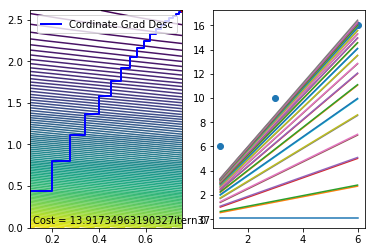

In [10]:
from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML, Image
#Plot the contour
fig1, (ax1,ax2) = plt.subplots(1,2)
#fig1.addsubplot(111)
ax1.contour(a0, a1, Z, 100)
ax2.scatter([1,3,6],[6,10,16])

# Create animation
line, = ax1.plot([], [], 'b', label = 'Cordinate Grad Desc', lw = 2)
point, = ax1.plot([], [], '*', color = 'red', markersize = 4)
value_display = ax1.text(0.02, 0.02, '', transform=ax1.transAxes)


def init_1():
    line.set_data([], [])
    point.set_data([], [])
    value_display.set_text('')

    return line, point, value_display

def animate_1(i):
    # Animate line
    line.set_data(theta0[:i], theta1[:i])
    # Animate points
    point.set_data(theta0[i], theta1[i])
    ax2.plot([1,3,6],[theta0[i]+theta1[i],theta0[i]+3*theta1[i],theta0[i]+6*theta1[i]])


    # Animate value display
    value_display.set_text('Cost = ' + str(J_hist[i]) +'itern'  + str(i)) #

    return line, point, value_display

ax1.legend(loc = 1)

anim1 = animation.FuncAnimation(fig1, animate_1, init_func=init_1,
                               frames=len(theta0), interval=100, 
                               repeat_delay=60, blit=True)
HTML(anim1.to_jshtml())
#HTML(anim2.to_jshtml())


### 2(c) coordinate Descent Lasso

In [11]:
ri,ci=training_input_feat_df.shape
X1_np=np.ones([ri,ci+1])
Y1_np=np.ones([ri,1])
Y1_np[:,0]=training_output_feat_df.values
#print(Y1_np.shape)
X1_np[:,1:ci+1]=training_input_feat_df.values

#print(X1_np.shape)
theta_cd=np.zeros([ci+1,1])
#print(theta_cd[i])
l=1
for i in range(1,5):
    for temp in range(len(theta_cd)):
        theta_temp=theta_cd
        theta_temp[temp,0]=0
        #print(theta_temp)
        err=(X1_np[:,temp]@((Y1_np)-(X1_np@theta_temp)))
        #print(err)
        rho_j=np.sum(err)
        #print(rho_j)
        z_j=np.sum(X1_np[:,temp])
        #print(z_j)
        #err2=err@err.transpose()
        #print(err.shape)
        if rho_j>(l/2):
            theta_cd[temp,0]=(rho_j-(l/2))/z_j
        elif rho_j<(-l/2):
            theta_cd[temp,0]=(rho_j+(l/2))/z_j
        else:
            theta_cd[temp,0]=0
        #theta_cd[temp,0]=theta_cd[temp,0]-((0.0000001/ri)*(err))
print("Theta is\n",theta_cd)   
 #(X1_np[:,temp])   

Theta is
 [[ 3.24047422e+14]
 [ 3.05457241e+06]
 [-8.87770160e+09]
 [ 1.14595143e+11]
 [-6.07317369e+13]
 [ 1.28493182e+14]
 [-3.40636203e+15]]


### 2(d) SDG

In [12]:
import random
ri,ci=input_feat_df.shape
X1_np=np.ones([ri,ci+1])
Y1_np=np.ones([ri,1])
Y1_np[:,0]=output_feat_df.values
#print(Y1_np.shape)
X1_np[:,1:ci+1]=input_feat_df.values
theta_cd=np.zeros([ci+1,1])

#print("theta shape",theta_cd.shape)

for i in range(1,100):
    indxs=random.randint(0,(ri-1))
    error=np.dot(X1_np[indxs,:],theta_cd)-Y1_np[indxs]
    #print(error.shape)
    error=error*X1_np[indxs,:].transpose()
    error=np.matrix(error)
    theta_cd=theta_cd-0.0000001*error.transpose()
print(theta_cd)
    
    

[[ 9.47069820e-06]
 [ 1.90605795e-02]
 [-3.87165312e-04]
 [-6.72213193e-03]
 [ 1.99064826e-04]
 [ 2.36771582e-04]
 [ 1.15119923e-03]]


### 3(a) SDG animation

In [13]:
def SDG(training_input_feat_df,training_output_feat_df):
    ri,ci=training_input_feat_df.shape
    X1_np=np.ones([ri,ci+1])
    Y1_np=np.ones([ri,1])
    Y1_np[:,0]=training_output_feat_df
    print(Y1_np.shape)
    X1_np[:,1:ci+1]=training_input_feat_df
    theta_cd=np.zeros([ci+1,1])
    theta0=[]
    theta1=[]
    J_hist=[]
    #print(theta_cd[i])
    for i in range(1,100):
        indxs=random.randint(0,(ri-1))
        error=np.dot(X1_np[indxs,:],theta_cd)-Y1_np[indxs]
        #print(error.shape)
        error=error*X1_np[indxs,:].transpose()
        error=np.matrix(error)
        theta_cd=theta_cd-0.01*error.transpose()
        theta0.append(theta_cd[0,0])
        theta1.append(theta_cd[1,0])
    #print("theta0 is\n",theta0)
    #print("theta1 is\n",theta1)
    #print("J is", J_hist)
    return theta_cd,theta0,theta1
 #(X1_np[:,temp])   

In [14]:
from matplotlib import pyplot as plt
x=np.array([[1],[3],[6]])
y=np.array([6,10,16])
y1=np.array([[6],[10],[16]])
theta_cd,theta0,theta1=SDG(x,y)
#print(y.shape)
#z1=np.zeros([3,1])
z3=[]
T0, T1 = np.meshgrid(theta0,theta1)
#T0, T1 = np.meshgrid(np.linspace(-10,0.1,10),np.linspace(-10,0.1,10))
#print(T0.shape)
z2=np.array([T0.shape])

for t0, t1 in zip(np.ravel(T0), np.ravel(T1)):
    z1=np.sum(((t0+t1*x)-y1)**2)
    z3.append(z1)
    #print(z1)
#np.reshape(z3,T0.shape)
#z3.reshape(T0.shape)
Z=np.asarray(z3)
#print(Z.shape)
Z=Z.reshape(T0.shape)

(3, 1)


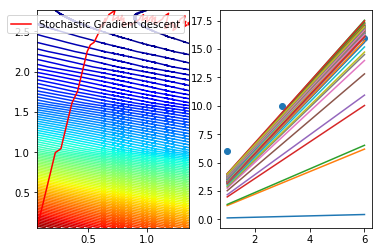

In [15]:
from matplotlib import pyplot as plt
from matplotlib import animation
from IPython.display import HTML, Image
#Plot the contour
fig1, (ax1,ax2) = plt.subplots(1,2)
#fig1.addsubplot(111)
ax1.contour(T0, T1, Z, 100, cmap = 'jet')
ax2.scatter([1,3,6],[6,10,16])

# Create animation
line, = ax1.plot([], [], 'r', label = 'Stochastic Gradient descent', lw = 1.5)
point, = ax1.plot([], [], '*', color = 'red', markersize = 4)
value_display = ax1.text(0.02, 0.02, '', transform=ax1.transAxes)

def init_1():
    line.set_data([], [])
    point.set_data([], [])
    value_display.set_text('')

    return line, point, value_display

def animate_1(i):
    # Animate line
    line.set_data(theta0[:i], theta1[:i])
    # Animate points
    point.set_data(theta0[i], theta1[i])
    ax2.plot([1,3,6],[theta0[i]+theta1[i],theta0[i]+3*theta1[i],theta0[i]+6*theta1[i]])


    # Animate value display
    #value_display.set_text('Min = ' + str(J_hist[i]))

    return line, point, value_display
ax1.legend(loc = 1)

anim1 = animation.FuncAnimation(fig1, animate_1, init_func=init_1,
                               frames=len(theta0), interval=100, 
                               repeat_delay=60, blit=True)
#plt.show()
HTML(anim1.to_jshtml())
#HTML(anim2.to_jshtml())


### 2(e) Autograd LASSO

In [16]:
import autograd 
#import grad from autograd
from autograd import grad
#start=time.clock()
r2,c2=df.shape
list_of_feat2=np.ones(c2-2) #making initial guesses
print("list of feat",list_of_feat2)
y=df.iloc[:,-1]  #output
#print("y shape",y.shape)
input_feat=df.iloc[:,1:c2-1]
input_feat=input_feat.values
lam=1
#input_feat[:]=1
#print("input_feat",input_feat)
inputT=np.transpose(input_feat)
print("inputT shape",inputT.shape)

def cost(list_of_feat2,input_feat,y):
    #cst=(np.dot(input_feat,list_of_feat)- y)**2
    cst=((np.sum(np.square(np.dot(input_feat,list_of_feat2)-y))+lam*sum(list_of_feat2))/(2*r2))
    return cst

diff_cost=grad(cost)
for i in range(1,5):
#error=((np.dot(input_feat,list_of_feat)))
    #temp=list_of_feat-((np.dot(inputT,(np.dot(input_feat,list_of_feat)- y)))*(0.000000001/r2))
    temp=list_of_feat2-0.0000001*diff_cost(list_of_feat2,input_feat,y)
    #print("temp is",temp)
    #print("mannual is",(np.sum(np.square(np.dot(input_feat,list_of_feat)-y)))/(2*r2))
    list_of_feat2=temp
print(temp)
#t3=time.clock()-start
print(list_of_feat2)



list of feat [1. 1. 1. 1. 1. 1.]
inputT shape (6, 414)
[-0.08157165  0.99034836  0.10964874  0.9982331   0.98658714  0.93470902]
[-0.08157165  0.99034836  0.10964874  0.9982331   0.98658714  0.93470902]


### 4(A) Scikit learn L2 regularization

In [17]:
from sklearn import linear_model
reg = linear_model.Ridge(alpha=1, normalize=True)
#reg.fit(training_input_feat_df, training_output_feat_df)
reg.fit([[1, 2], [2, 4], [3, 6], [4, 8]], [2, 3, 4, 5])
#reg.predict([])
reg.coef_


array([0.33333333, 0.16666667])

### Qn No 5

In [18]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score

clf = linear_model.Lasso(alpha=0.1, normalize=True)
clf.fit(training_input_feat_df, training_output_feat_df)
training_predicted=clf.predict(training_input_feat_df)
testing_predicted=clf.predict(testing_input_feat_df)
print("Training RMSE LASSO",mean_squared_error(training_output_feat_df,training_predicted))
print("Testing RMSE LASSO",mean_squared_error(testing_output_feat_df,testing_predicted))

reg = linear_model.Ridge(alpha=.1, normalize=True)
reg.fit(training_input_feat_df, training_output_feat_df)
training_predicted2=reg.predict(training_input_feat_df)
testing_predicted2=reg.predict(testing_input_feat_df)
print("Training RMSE Ridgge",mean_squared_error(training_output_feat_df,training_predicted2))
print("Testing RMSE Ridge",mean_squared_error(testing_output_feat_df,testing_predicted2))

#accuracy_score(training_output_feat_df,training_predicted)
#print("Testing Accuracy",accuracy_score(testing_output_feat_df,testing_predicted))


Training RMSE LASSO 90.75260699082702
Testing RMSE LASSO 72.35389500949543
Training RMSE Ridgge 82.21059605462375
Testing RMSE Ridge 66.592487651369


### 5(A) 5 fold CV for ridge

In [21]:
from sklearn import datasets, linear_model
from sklearn.model_selection import cross_validate
from sklearn.metrics.scorer import make_scorer
from sklearn.metrics import confusion_matrix
from sklearn.svm import LinearSVC
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
X = input_feat_df
y = output_feat_df
kf = KFold(n_splits=5)
kf.get_n_splits(X)

#print(kf)  
lamda=[0.001, 0.01,0.1,1,10,100]
test_list=[]
train_list=[]
for train_index, test_index in kf.split(X):
   #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    #print(y_train.head())
    list2=[]
    list3=[]
    for x in lamda:
         #print(x)
        ridge = linear_model.Ridge(x,normalize=True)
        ridge.fit(X_train, y_train)
        temp=ridge.predict(X_test)
        temp2=ridge.predict(X_train)
        list2.append(mean_squared_error(y_test,temp))
        list3.append(mean_squared_error(y_train,temp2))
    test_list.append(list2)
    train_list.append(list3)
a=(np.argmin(test_list))
#print(test_list.shape)
a1=np.asarray(test_list)
a2=np.asarray(train_list)
print("Test RMSE error",a1)
print("Train RMSE error",a2)
a11=np.argmin(a1,axis=1)
a22=np.argmin(a2,axis=1)
#print(xx)
#print(test_list)
#print(train_list)
fltest=[]
fltrain=[]
for x,y in zip(a11,a22):
    fltest.append(lamda[x])
    fltrain.append(lamda[y])

print("Min lamda for each test fold",fltest)
print("Min lamda for each train fold",fltrain)

Test RMSE error [[ 49.90043158  49.92996452  50.709069    65.34282549 132.61605022
  167.93117721]
 [ 89.02523227  88.99379229  89.06953118  97.75893786 152.55274968
  183.39996937]
 [ 57.84498725  57.68517636  57.53483864  69.76419514 133.46486655
  168.43517103]
 [134.83590545 134.94741401 136.18516651 149.25658766 206.80074681
  237.53606722]
 [ 60.0570422   60.09181678  60.55256275  68.44101634 116.28683191
  143.87247021]]
Train RMSE error [[ 84.12060847  84.13042276  84.6813849   96.06739404 152.36362021
  182.80989545]
 [ 74.35696703  74.36684463  74.92150279  86.76584222 146.5830754
  178.93428228]
 [ 82.14731765  82.16073351  82.82417313  94.25799934 151.30298192
  182.64748176]
 [ 62.8346881   62.84412016  63.36200402  74.71151444 133.10808364
  165.30053608]
 [ 81.49443719  81.50379936  82.01833055  93.52043227 154.4116407
  188.39894681]]
Min lamda for each test fold [0.001, 0.01, 0.1, 0.001, 0.001]
Min lamda for each train fold [0.001, 0.001, 0.001, 0.001, 0.001]


### 5(B) 5 Fold CV for LASSO

In [22]:
X = input_feat_df
y = output_feat_df
kf = KFold(n_splits=5)
kf.get_n_splits(X)

#print(kf)  
lamda=[0.001, 0.01,0.1,1,10,100]
test_list=[]
train_list=[]
for train_index, test_index in kf.split(X):
   #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    #print(y_train.head())
    list2=[]
    list3=[]
    for x in lamda:
         #print(x)
        ridge = linear_model.Lasso(x,normalize=True)
        ridge.fit(X_train, y_train)
        temp=ridge.predict(X_test)
        temp2=ridge.predict(X_train)
        list2.append(mean_squared_error(y_test,temp))
        list3.append(mean_squared_error(y_train,temp2))
    test_list.append(list2)
    train_list.append(list3)
a=(np.argmin(test_list))
#print(test_list.shape)
a1=np.asarray(test_list)
a2=np.asarray(train_list)
print("Test RMSE error",a1)
print("Train RMSE error",a2)
a11=np.argmin(a1,axis=1)
a22=np.argmin(a2,axis=1)
#print(xx)
#print(test_list)
#print(train_list)
fltest=[]
fltrain=[]
for x,y in zip(a11,a22):
    fltest.append(lamda[x])
    fltrain.append(lamda[y])

print("Min lamda for each test fold",fltest)
print("Min lamda for each train fold",fltrain)

Test RMSE error [[ 49.93275282  50.67394762  68.17519635 173.38310622 173.38310622
  173.38310622]
 [ 88.98657121  88.57972719  93.79128946 188.21653159 188.21653159
  188.21653159]
 [ 57.80146493  57.66494873  68.38564071 173.88852647 173.88852647
  173.88852647]
 [134.87234331 135.45201634 148.56248988 242.31034611 242.31034611
  242.31034611]
 [ 60.03629331  59.76574964  64.60332665 148.22036007 148.22036007
  148.22036007]]
Train RMSE error [[ 84.12430933  84.28692695  94.30641166 187.53779721 187.53779721
  187.53779721]
 [ 74.36088773  74.48073036  85.93996975 183.95411013 183.95411013
  183.95411013]
 [ 82.15183391  82.30432436  93.11691306 187.53670339 187.53670339
  187.53670339]
 [ 62.83579717  62.95501796  73.01105856 170.32986501 170.32986501
  170.32986501]
 [ 81.49878264  81.61354651  91.67926901 193.72524822 193.72524822
  193.72524822]]
Min lamda for each test fold [0.001, 0.01, 0.01, 0.001, 0.01]
Min lamda for each train fold [0.001, 0.001, 0.001, 0.001, 0.001]


### 5(c) Regularization for LASSO and Ridge

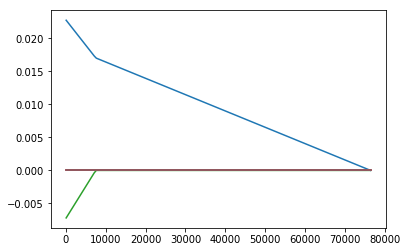

In [23]:
from sklearn import linear_model
from sklearn.linear_model import LassoLarsCV
X=input_feat_df.values
Y=output_feat_df.values
alp, coefs,_= linear_model.lasso_path(X,Y)
#print(input_feat_df)
#sklearn.linear_model.lars_path(input_feat_df, output_feat_df, max_iter=500)
plt.plot(alp,coefs.T)


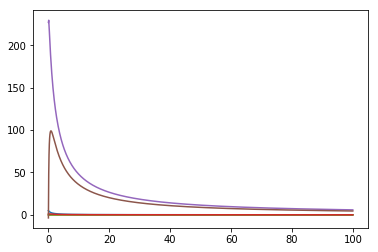

In [24]:
alphas=np.arange(0.01,100,0.1)
coefs=[]
for x in alphas:
         #print(x)
        temp = linear_model.Ridge(alpha=x,normalize=True)
        temp.fit(input_feat_df, output_feat_df)
        coefs.append(temp.coef_)
#print(coefs)
#coefs2=(np.asarray(coefs)).reshape(1000,-1)
plt.plot(alphas,coefs)

### 5(D) Test error as a function of lamda

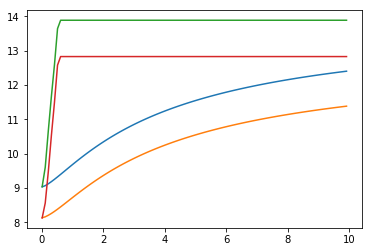

In [33]:
a=np.arange(0.01,10,0.1)
op=[]
for x in a:
         #print(x)
        temp = linear_model.Ridge(alpha=x,normalize=True)
        temp.fit(training_input_feat_df, training_output_feat_df)
        out1=temp.predict(training_input_feat_df)
        out2=temp.predict(testing_input_feat_df)
        e1=np.sqrt(mean_squared_error(training_output_feat_df,out1))
        e2=np.sqrt(mean_squared_error(testing_output_feat_df,out2))
        
        
        temp2 = linear_model.Lasso(alpha=x,normalize=True)
        temp2.fit(training_input_feat_df, training_output_feat_df)
        out3=temp2.predict(training_input_feat_df)
        out4=temp2.predict(testing_input_feat_df)
        
        
        e3=np.sqrt(mean_squared_error(training_output_feat_df,out3))
        e4=np.sqrt(mean_squared_error(testing_output_feat_df,out4))
        op.append([e1,e2,e3,e4])
        
        
#print(coefs)
#coefs2=(np.asarray(coefs)).reshape(1000,-1)
plt.plot(a,op)
#handles, labels = plt.get_legend_handles_labels()
#ax.legend(handles, labels)